# Data analysis for 2 channels

Data files comes in matrices having as rows increasing time-steps and as columns
- time 
- continuous FI 11
- continuous FI 12
- continuous FI 22
- FI on conditional state 11
- FI on conditional state 12
- FI on conditional state 22
- QFI 11
- QFI 12
- QFI 22
- absolute value of D 12

In [1]:
using Plots
using DelimitedFiles
using LinearAlgebra

### Homodyne detection

In [4]:
hd = readdlm("Data/Output_TwoC_HD.dat")

14000×11 Array{Float64,2}:
 0.0005  3.11059e-11  -3.99925e-13  …  -9.6203e-27    2.49937e-7  1.0
 0.001   6.21241e-11  -1.81334e-13     -2.97321e-12   9.99502e-7  1.0
 0.0015  9.34085e-11   1.9132e-13      -5.8613e-12    2.24832e-6  1.0
 0.002   1.25217e-10   3.13423e-13     -5.01536e-12   3.99602e-6  1.0
 0.0025  1.56969e-10   1.1667e-13      -1.96028e-12   6.2422e-6   1.0
 0.003   1.88006e-10   4.27091e-13  …   9.36665e-12   8.98652e-6  1.0
 0.0035  2.18294e-10  -1.14877e-12      3.66672e-12   1.22286e-5  1.0
 0.004   2.49143e-10   4.64792e-13     -1.12848e-11   1.59681e-5  1.0
 0.0045  2.81096e-10   2.11037e-13     -1.25053e-12   2.02046e-5  1.0
 0.005   3.1388e-10    3.49251e-13      1.32023e-11   2.49377e-5  1.0
 0.0055  3.46893e-10   8.89868e-13  …   4.17414e-11   3.0167e-5   1.0
 0.006   3.76808e-10   1.61209e-12      1.06651e-10   3.58922e-5  1.0
 0.0065  4.04846e-10   8.57613e-13      1.80139e-10   4.2113e-5   1.0
 ⋮                                  ⋱                          

Components of the Fisher Information for the homodyne detection, Quantum Fisher Information and Fisher Information for the strong measurement on the conditional state

In [5]:
label1 = ["FI_xx" "QFI_xx" "FIC_xx"]
label2 = ["FI_xy" "QFI_xy" "FIC_xy"]
label3 = ["FI_yy" "QFI_yy" "FIC_yy"]

p1 = plot(hd[:,1], [hd[:,2], hd[:,8], hd[:,5]], xlabel = "t", label = label1) 
p2 = plot(hd[:,1], [hd[:,3], hd[:,9], hd[:,6]], xlabel = "t", label = label2) 
p3 = plot(hd[:,1], [hd[:,4], hd[:,10], hd[:,7]], xlabel = "t", label = label3) 
plot(p1, p2, p3, layout = (3,1), xlim = (0,7))

Module of the Uhlmann curvature

In [4]:
p = plot(hd[:,1], hd[:,11], xlabel = "t", label = "D_xy", xlim = (0,7))
plot(p)

LoadError: BoundsError: attempt to access 14000×10 Array{Float64,2} at index [1:14000, 11]

### Photodetection

In [6]:
pd = readdlm("Data/Output_TwoC_PD.dat");

Components of the Fisher Information for the photodetection, Quantum Fisher Information and Fisher Information for the strong measurement on the conditional state

In [7]:
p1 = plot(pd[:,1], [pd[:,2], pd[:,8], pd[:,5]], xlabel = "t", label = label1) 
p2 = plot(pd[:,1], [pd[:,3], pd[:,9], pd[:,6]], xlabel = "t", label = label2) 
p3 = plot(pd[:,1], [pd[:,4], pd[:,10], pd[:,7]], xlabel = "t", label = label3) 
plot(p1, p2, p3, layout = (3,1), xlim = (0,7))

Module of the Uhlmann curvature

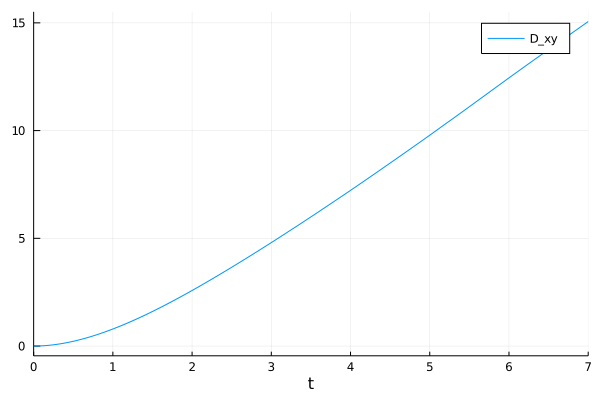

In [7]:
p = plot(pd[:,1], pd[:,11], xlabel = "t", label = "D_xy", xlim = (0,7))
plot(p)

### Comparison of the different strategies

In [8]:
dt = 0.0005
Nfinal = 7.
Ntime = Int(floor(Nfinal/dt))

CQ_HD = zeros(Ntime)
CQ_PD = zeros(Ntime)
CF_HD = zeros(Ntime)
CF_PD = zeros(Ntime)
Molmer = zeros(Ntime)
T_HD = zeros(Ntime)
T_PD = zeros(Ntime)
R_HD = zeros(Ntime)
R_PD = zeros(Ntime)

for jt = 1 : Ntime
    Qeff_PD = ([pd[jt,2]+pd[jt,8] pd[jt,3]+pd[jt,9]; pd[jt,3]+pd[jt,9] pd[jt,4]+pd[jt,10]])
    Feff_PD = ([pd[jt,2]+pd[jt,5] pd[jt,3]+pd[jt,6]; pd[jt,3]+pd[jt,6] pd[jt,4]+pd[jt,7]])
    MQI = ([4*(-2+2exp(-jt*dt/2)+jt*dt) 0; 0 4*(-2+2exp(-jt*dt/2)+jt*dt)])
    CQ_PD[jt] = 1/tr(inv(Qeff_PD))
    CF_PD[jt] = 1/tr(inv(Feff_PD))
    Molmer[jt] = 1/tr(inv(MQI))
    T_PD[jt] = CF_PD[jt]/CQ_PD[jt]
    Qeff_HD = ([hd[jt,2]+hd[jt,8] hd[jt,3]+hd[jt,9]; hd[jt,3]+hd[jt,9] hd[jt,4]+hd[jt,10]])
    Feff_HD = ([hd[jt,2]+hd[jt,5] hd[jt,3]+hd[jt,6]; hd[jt,3]+hd[jt,6] hd[jt,4]+hd[jt,7]])  
    CQ_HD[jt] = 1/tr(inv(Qeff_HD))
    CF_HD[jt] = 1/tr(inv(Feff_HD))
    T_HD[jt] = CF_HD[jt]/CQ_HD[jt]
    #R_HD[jt] = hd[jt,11]/sqrt(det(Qeff_HD))
    #R_PD[jt] = pd[jt,11]/sqrt(det(Qeff_PD))
end

In [12]:
styles = filter((s->begin
                s in Plots.supported_styles()
            end), [:dash, :solid, :solid])
styles = reshape(styles, 1, length(styles))

label_ult = ["1/Tr[UQI^-1]" "1/Tr[Qeff_HD^-1]" "1/Tr[Qeff_PD^-1]"]
p_ult = plot(hd[:,1], [Molmer, CQ_HD, CQ_PD], line = (2, styles), xlabel = "t   [κ^-1]", ylabel = "[κ^-2]", label = label_ult, xlim = (0,7),  ylim = (-0.2,11)) 
plot(p_ult,legend = :topleft)
savefig("ultimate_2c.png")

In [13]:
label_ult = ["1/Tr[UQI^-1]" "1/Tr[Feff_HD^-1]" "1/Tr[Feff_PD^-1]"]
p_ult = plot(hd[:,1], [Molmer, CF_HD, CF_PD], line = (2, styles), xlabel = "t   [κ^-1]", ylabel = "[κ^-2]", label = label_ult, xlim = (0,7),  ylim = (-0.2,11)) 
plot(p_ult,legend = :topleft)
savefig("ultimate_2c_FI.png")

In [42]:
label4 = ["1/Tr[Qeff_HD^-1]" "1/Tr[Feff_HD^-1]"]
label5 = ["1/Tr[Qeff_PD^-1]" "1/Tr[Feff_PD^-1]"]

p4 = plot(hd[:,1], [CQ_HD, CF_HD], xlabel = "t", label = label4) 
p5 = plot(pd[:,1], [CQ_PD, CF_PD], xlabel = "t", label = label5) 
plot(p4, p5, layout = (2,1), xlim = (0,7))

In [15]:
label_t = ["T_HD" "T_PD" ]
p_t = plot(hd[:,1], [T_HD, T_PD], line = (2), xlabel = "t   [κ^-1]", label = label_t, xlim = (0,7), ylim = (0.2,0.8)) 
plot(p_t, legend = :topleft)
savefig("t_2c.png")

In [51]:
label_u = ["|D_xy|_HD" "|D_xy|_PD" ]
p_u = plot(hd[:,1], [hd[:,11], pd[:,11]], line = (2), xlabel = "t   [κ^-1]", label = label_u, xlim = (0,7)) 
plot(p_u)
#savefig("ulhmann_2c.png")

In [53]:
label_r = ["R_HD" "R_PD"]
p_r = plot(hd[:,1], [R_HD, R_PD], line = (2), xlabel = "t   [κ^-1]", label = label_r, xlim = (0,7)) 
plot(p_r)
#savefig("r_2c.png")